In [1]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 18.7 MB/s eta 0:00:00


# YOLOv8 is a DEEP LEARNING model that:

  • Uses Convolutional Neural Networks CNNs

  • Learns features automatically no manual feature engineering!
  
  • Can detect multiple objects in one image   

  •  Works in real-time

  • Pre-trained on millions of images

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
import torch
from PIL import Image
import shutil
from pathlib import Path
import yaml

print("✓ Libraries imported successfully!")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✓ Libraries imported successfully!


============================================================
BLOCK 2: UNDERSTAND YOLOV8 STRUCTURE & REQUIREMENTS
============================================================
Explanation:
Before training, let's understand how YOLOv8 works differently
from traditional ML models (SVM, KNN, LR)

KEY DIFFERENCES:

Traditional ML (SVM/KNN/LR):
- Fixed size images (64x64)
- Manual feature extraction (HOG, LBP)
- Single classification per image
- Needs small datasets

YOLOv8 (Deep Learning):
- Can handle various image sizes
- Automatic feature learning through CNN layers
- Can detect MULTIPLE objects + their LOCATIONS (bounding boxes)
- Needs more data and GPU for training
- Much more powerful!

YOLOv8 Dataset Format Requirements:
Your data needs to be organized differently than before!

YOLO expects:
dataset/

├── train

│   ├── images        
│   └── labels

         
├── valid

│   ├── images

│   └── labels

└── test

│   ├── images

│   └── labels



IMPORTANT NOTE:
Since your current dataset is organized by CLASS FOLDERS,
we need to convert it to YOLO format!

YOLOV8 vs TRADITIONAL ML



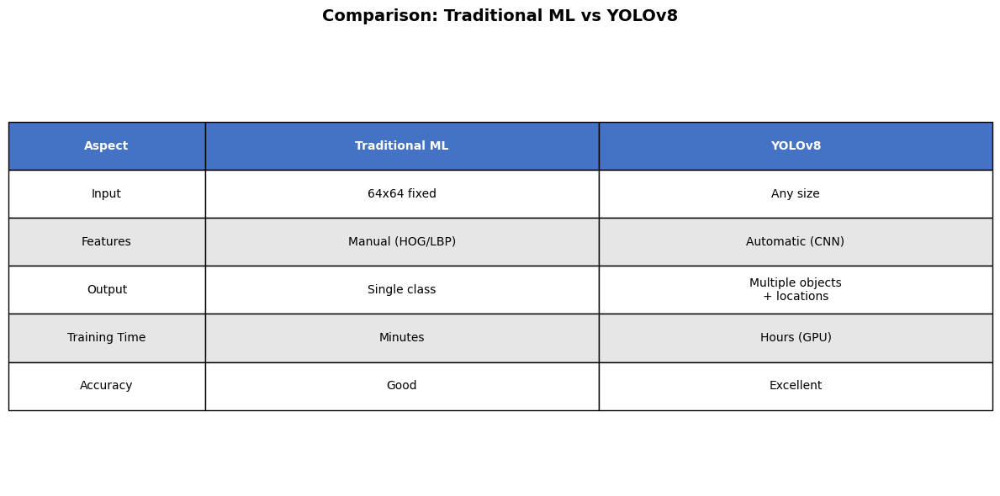


✓ Understanding YOLOv8 structure complete!

 IMPORTANT NOTES:
  1. YOLOv8 is MUCH more powerful than traditional ML
  2. It can detect WHERE objects are (bounding boxes)
  3. Requires different data format (images + labels)
  4. Training takes longer but results are better
  5. Best with GPU (but can work on CPU)

Next: We'll set up your dataset in YOLO format!


In [3]:
print("="*60)
print("YOLOV8 vs TRADITIONAL ML")
print("="*60)
print()

# Create comparison visualization
comparison_data = {
    'Aspect': ['Input', 'Features', 'Output', 'Training Time', 'Accuracy'],
    'Traditional ML\n(SVM/KNN/LR)': [
        '64x64 fixed',
        'Manual (HOG/LBP)',
        'Single class',
        'Minutes',
        'Good'
    ],
    'YOLOv8\n(Deep Learning)': [
        'Any size',
        'Automatic (CNN)',
        'Multiple objects\n+ locations',
        'Hours (GPU)',
        'Excellent'
    ]
}

fig, ax = plt.subplots(figsize=(12, 6))
ax.axis('tight')
ax.axis('off')

# Create table
table_data = []
for i, aspect in enumerate(comparison_data['Aspect']):
    table_data.append([
        aspect,
        comparison_data['Traditional ML\n(SVM/KNN/LR)'][i],
        comparison_data['YOLOv8\n(Deep Learning)'][i]
    ])

table = ax.table(cellText=table_data,
                colLabels=['Aspect', 'Traditional ML', 'YOLOv8'],
                cellLoc='center',
                loc='center',
                colWidths=[0.2, 0.4, 0.4])

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 3)

# Color header
for i in range(3):
    table[(0, i)].set_facecolor('#4472C4')
    table[(0, i)].set_text_props(weight='bold', color='white')

# Alternate row colors
for i in range(1, 6):
    for j in range(3):
        if i % 2 == 0:
            table[(i, j)].set_facecolor('#E7E6E6')

plt.title('Comparison: Traditional ML vs YOLOv8',
         fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

print("\n✓ Understanding YOLOv8 structure complete!")
print()
print(" IMPORTANT NOTES:")
print("  1. YOLOv8 is MUCH more powerful than traditional ML")
print("  2. It can detect WHERE objects are (bounding boxes)")
print("  3. Requires different data format (images + labels)")
print("  4. Training takes longer but results are better")
print("  5. Best with GPU (but can work on CPU)")
print()
print("Next: We'll set up your dataset in YOLO format!")

In [4]:
import zipfile


zip_path = "road_detection_datasetV2.zip"     # Change this to your actual zip file name
extract_dir = "dataset"           # Where to extract your files

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

In [5]:
dataset_path = "dataset"  # Your main dataset folder

# Paths to splits
train_images = os.path.join(dataset_path, "train", "images")
train_labels = os.path.join(dataset_path, "train", "labels")

valid_images = os.path.join(dataset_path, "valid", "images")
valid_labels = os.path.join(dataset_path, "valid", "labels")

test_images = os.path.join(dataset_path, "test", "images")
test_labels = os.path.join(dataset_path, "test", "labels")

# Path to data.yaml
data_yaml_path = os.path.join(dataset_path, "data.yaml")

print("="*60)
print("DATASET PATHS (YOUR YOLO-FORMAT DATASET)")
print("="*60)
print()
print(f"Dataset Root: {dataset_path}")
print()
print("Training Set:")
print(f"  Images: {train_images}")
print(f"  Labels: {train_labels}")
print()
print("Validation Set:")
print(f"  Images: {valid_images}")
print(f"  Labels: {valid_labels}")
print()
print("Test Set:")
print(f"  Images: {test_images}")
print(f"  Labels: {test_labels}")
print()
print(f"Config File: {data_yaml_path}")
print()
print("="*60)
print()
print("✓ Your dataset is already in correct YOLO format!")
print("✓ No conversion needed!")
print()
print("📝 YOLO Label Format:")
print("   Each .txt file contains one line per object:")
print("   class_id center_x center_y width height")
print("   Example: 0 0.5 0.5 0.8 0.8")
print("   (All coordinates are normalized 0-1)")

DATASET PATHS (YOUR YOLO-FORMAT DATASET)

Dataset Root: dataset

Training Set:
  Images: dataset/train/images
  Labels: dataset/train/labels

Validation Set:
  Images: dataset/valid/images
  Labels: dataset/valid/labels

Test Set:
  Images: dataset/test/images
  Labels: dataset/test/labels

Config File: dataset/data.yaml


✓ Your dataset is already in correct YOLO format!
✓ No conversion needed!

📝 YOLO Label Format:
   Each .txt file contains one line per object:
   class_id center_x center_y width height
   Example: 0 0.5 0.5 0.8 0.8
   (All coordinates are normalized 0-1)


In [6]:
print("🔍 Verifying dataset structure...")
print()

# Check if main folders exist
print("="*60)
print("FOLDER EXISTENCE CHECK")
print("="*60)

folders_to_check = {
    'Train Images': train_images,
    'Train Labels': train_labels,
    'Valid Images': valid_images,
    'Valid Labels': valid_labels,
    'Test Images': test_images,
    'Test Labels': test_labels,
    'Config File': data_yaml_path
}

all_exist = True
for name, path in folders_to_check.items():
    exists = os.path.exists(path)
    status = "✓" if exists else "✗"
    print(f"  {status} {name:15s}: {path}")
    if not exists:
        all_exist = False

print("="*60)

if not all_exist:
    print("\n⚠ WARNING: Some folders/files are missing!")
    print("  Please check your dataset path is correct.")
    print(f"  Current path: {dataset_path}")
else:
    print("\n✓ All folders and files exist!")

print()

# Count files in each split
print("="*60)
print("DATASET STATISTICS")
print("="*60)
print()

def count_files(folder, extensions):
    """Count files with specific extensions in a folder"""
    if not os.path.exists(folder):
        return 0
    return len([f for f in os.listdir(folder)
                if any(f.endswith(ext) for ext in extensions)])

# Count images
train_img_count = count_files(train_images, ['.jpg', '.jpeg', '.png', '.bmp'])
valid_img_count = count_files(valid_images, ['.jpg', '.jpeg', '.png', '.bmp'])
test_img_count = count_files(test_images, ['.jpg', '.jpeg', '.png', '.bmp'])

# Count labels
train_lbl_count = count_files(train_labels, ['.txt'])
valid_lbl_count = count_files(valid_labels, ['.txt'])
test_lbl_count = count_files(test_labels, ['.txt'])

print("Training Set:")
print(f"  Images: {train_img_count:5d}")
print(f"  Labels: {train_lbl_count:5d}")
if train_img_count == train_lbl_count:
    print("  ✓ Images and labels match!")
else:
    print(f"  ⚠ Mismatch: {abs(train_img_count - train_lbl_count)} difference")

print()
print("Validation Set:")
print(f"  Images: {valid_img_count:5d}")
print(f"  Labels: {valid_lbl_count:5d}")
if valid_img_count == valid_lbl_count:
    print("  ✓ Images and labels match!")
else:
    print(f"  ⚠ Mismatch: {abs(valid_img_count - valid_lbl_count)} difference")

print()
print("Test Set:")
print(f"  Images: {test_img_count:5d}")
print(f"  Labels: {test_lbl_count:5d}")
if test_img_count == test_lbl_count:
    print("  ✓ Images and labels match!")
else:
    print(f"  ⚠ Mismatch: {abs(test_img_count - test_lbl_count)} difference")

print()
print("="*60)
print("TOTAL DATASET SIZE")
print("="*60)
total_images = train_img_count + valid_img_count + test_img_count
print(f"  Total Images: {total_images:5d}")
print(f"  Training:     {train_img_count:5d} ({train_img_count/total_images*100:.1f}%)")
print(f"  Validation:   {valid_img_count:5d} ({valid_img_count/total_images*100:.1f}%)")
print(f"  Test:         {test_img_count:5d} ({test_img_count/total_images*100:.1f}%)")
print("="*60)

print()
print("✓ Dataset structure verification complete!")

🔍 Verifying dataset structure...

FOLDER EXISTENCE CHECK
  ✓ Train Images   : dataset/train/images
  ✓ Train Labels   : dataset/train/labels
  ✓ Valid Images   : dataset/valid/images
  ✓ Valid Labels   : dataset/valid/labels
  ✓ Test Images    : dataset/test/images
  ✓ Test Labels    : dataset/test/labels
  ✓ Config File    : dataset/data.yaml

✓ All folders and files exist!

DATASET STATISTICS

Training Set:
  Images:   494
  Labels:   494
  ✓ Images and labels match!

Validation Set:
  Images:   187
  Labels:   187
  ✓ Images and labels match!

Test Set:
  Images:   133
  Labels:   133
  ✓ Images and labels match!

TOTAL DATASET SIZE
  Total Images:   814
  Training:       494 (60.7%)
  Validation:     187 (23.0%)
  Test:           133 (16.3%)

✓ Dataset structure verification complete!


# read the data.yaml file

In [7]:
print("📄 Reading data.yaml configuration file...")
print()

# Check if data.yaml exists
if not os.path.exists(data_yaml_path):
    print(f"❌ ERROR: data.yaml not found at {data_yaml_path}")
    print("   Please make sure the file exists in your dataset folder.")
else:
    # Read data.yaml
    with open(data_yaml_path, 'r') as f:
        data_config = yaml.safe_load(f)

    print("✓ data.yaml loaded successfully!")
    print()
    print("="*60)
    print("DATA.YAML CONTENTS")
    print("="*60)

    # Display the configuration
    with open(data_yaml_path, 'r') as f:
        config_content = f.read()
        print(config_content)

    print("="*60)
    print()

    # Extract key information
    print("📊 EXTRACTED CONFIGURATION:")
    print("-"*60)

    # Get train/val/test paths
    train_path = data_config.get('train', 'Not specified')
    val_path = data_config.get('val', 'Not specified')
    test_path = data_config.get('test', 'Not specified')

    print(f"Training path:   {train_path}")
    print(f"Validation path: {val_path}")
    print(f"Test path:       {test_path}")
    print()

    # Get number of classes
    nc = data_config.get('nc', 0)
    print(f"Number of classes (nc): {nc}")
    print()

    # Get class names
    class_names = data_config.get('names', [])
    print(f"Class names ({len(class_names)} classes):")
    for idx, name in enumerate(class_names):
        print(f"  {idx}: {name}")

    print("-"*60)


    # Store for later use
    num_classes = nc
    class_list = class_names

    print()
    print(f"✓ Ready to train with {num_classes} classes!")
    print(f"✓ Classes: {', '.join(class_list)}")

📄 Reading data.yaml configuration file...

✓ data.yaml loaded successfully!

DATA.YAML CONTENTS
train: ../train/images
val: ../valid/images
test: ../test/images

nc: 7
names: ['bicycles', 'buses', 'crosswalks', 'fire hydrants', 'motorcycles', 'traffic lights', 'vehicles']

roboflow:
  workspace: roboflow-100
  project: road-traffic
  version: 3
  license: CC BY 4.0
  url: https://universe.roboflow.com/roboflow-100/road-traffic/dataset/3

📊 EXTRACTED CONFIGURATION:
------------------------------------------------------------
Training path:   ../train/images
Validation path: ../valid/images
Test path:       ../test/images

Number of classes (nc): 7

Class names (7 classes):
  0: bicycles
  1: buses
  2: crosswalks
  3: fire hydrants
  4: motorcycles
  5: traffic lights
  6: vehicles
------------------------------------------------------------

✓ Ready to train with 7 classes!
✓ Classes: bicycles, buses, crosswalks, fire hydrants, motorcycles, traffic lights, vehicles


Let's visualize some training images with their labels!
This helps verify:
- Images load correctly
- Label files are formatted properly
- Bounding boxes are in the right places
- Classes are labeled correctly

🖼️ Visualizing sample images with labels...



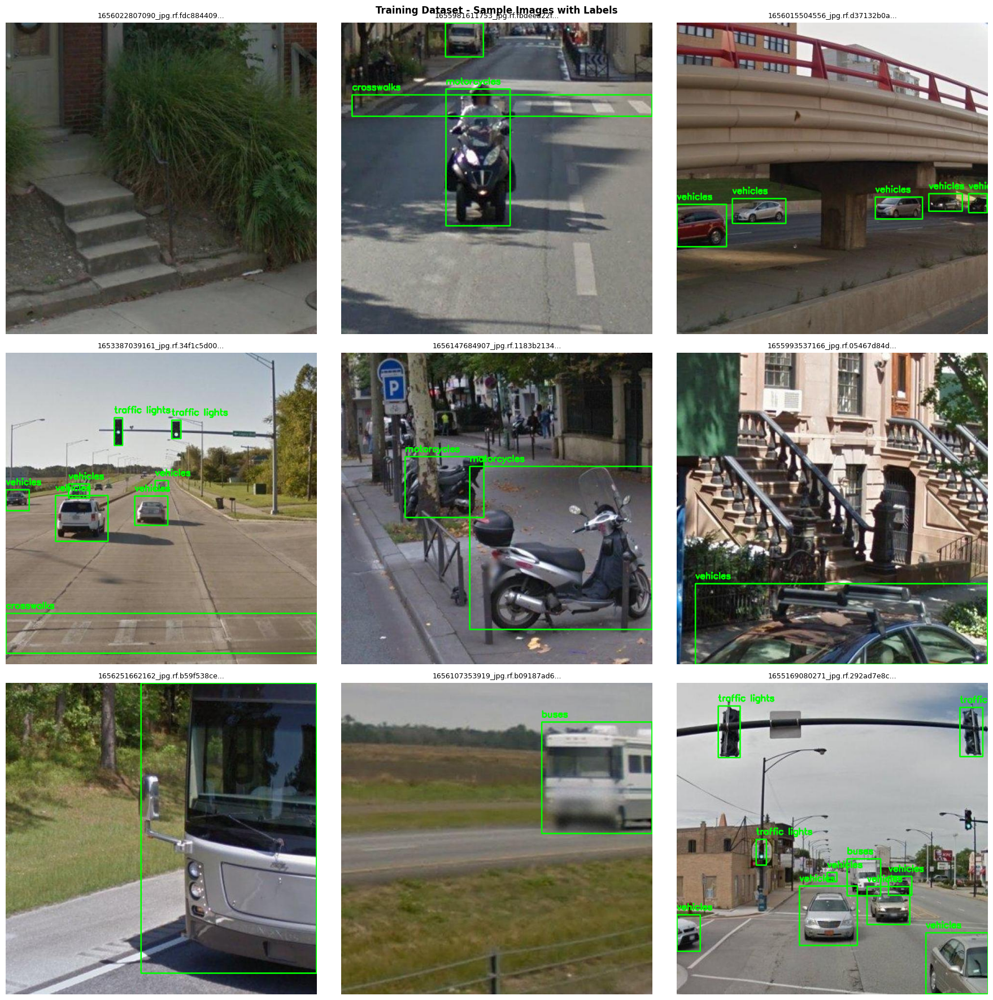

✓ Visualization complete!

📖 WHAT YOU SEE:
  • Green boxes = Object bounding boxes
  • Labels = Class names
  • Each image shows where objects are located

If boxes look correct, your dataset is ready for training!


In [8]:
import random

print("🖼️ Visualizing sample images with labels...")
print()

def draw_yolo_bbox(image, label_path, class_names):
    """
    Draw bounding boxes on image from YOLO label file

    Parameters:
    - image: numpy array (BGR)
    - label_path: path to .txt label file
    - class_names: list of class names

    Returns:
    - image with bounding boxes drawn
    """
    img_height, img_width = image.shape[:2]

    # Read label file
    if not os.path.exists(label_path):
        return image

    with open(label_path, 'r') as f:
        lines = f.readlines()

    # Draw each bounding box
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 5:
            continue

        class_id = int(parts[0])
        center_x = float(parts[1])
        center_y = float(parts[2])
        box_width = float(parts[3])
        box_height = float(parts[4])

        # Convert from YOLO format to pixel coordinates
        x_center = int(center_x * img_width)
        y_center = int(center_y * img_height)
        w = int(box_width * img_width)
        h = int(box_height * img_height)

        # Calculate corners
        x1 = int(x_center - w/2)
        y1 = int(y_center - h/2)
        x2 = int(x_center + w/2)
        y2 = int(y_center + h/2)

        # Draw rectangle
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Add class label
        if class_id < len(class_names):
            class_label = class_names[class_id]
        else:
            class_label = f"Class {class_id}"

        cv2.putText(image, class_label, (x1, y1-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    return image

# Get 9 random sample images from training set
train_image_files = [f for f in os.listdir(train_images)
                     if f.endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

# Select random samples
num_samples = min(9, len(train_image_files))
sample_files = random.sample(train_image_files, num_samples)

# Create visualization
fig, axes = plt.subplots(3, 3, figsize=(18, 18))
fig.suptitle('Training Dataset - Sample Images with Labels',
             fontsize=12, fontweight='bold')

for idx, img_file in enumerate(sample_files):
    row = idx // 3
    col = idx % 3

    # Read image
    img_path = os.path.join(train_images, img_file)
    image = cv2.imread(img_path)

    if image is None:
        axes[row, col].text(0.5, 0.5, 'Failed to load',
                           ha='center', va='center')
        axes[row, col].axis('off')
        continue

    # Get corresponding label file
    label_name = os.path.splitext(img_file)[0] + '.txt'
    label_path = os.path.join(train_labels, label_name)

    # Draw bounding boxes
    image_with_bbox = draw_yolo_bbox(image.copy(), label_path, class_list)

    # Convert BGR to RGB
    image_rgb = cv2.cvtColor(image_with_bbox, cv2.COLOR_BGR2RGB)

    # Display
    axes[row, col].imshow(image_rgb)
    axes[row, col].set_title(f'{img_file[:30]}...', fontsize=9)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

print("✓ Visualization complete!")
print()
print("📖 WHAT YOU SEE:")
print("  • Green boxes = Object bounding boxes")
print("  • Labels = Class names")
print("  • Each image shows where objects are located")
print()
print("If boxes look correct, your dataset is ready for training!")

# anlyze for the dataset

📊 Analyzing label distribution across dataset...

Analyzing training set...
Analyzing validation set...
Analyzing test set...

CLASS DISTRIBUTION

Class                   Train    Valid     Test    Total
------------------------------------------------------------
bicycles                   46       14       22       82
buses                      88       11       12      111
crosswalks                157       46       81      284
fire hydrants              60       11       23       94
motorcycles               158       52       30      240
traffic lights            459      364      129      952
vehicles                  763      300      209     1272
------------------------------------------------------------
TOTAL                    1731      798      506     3035



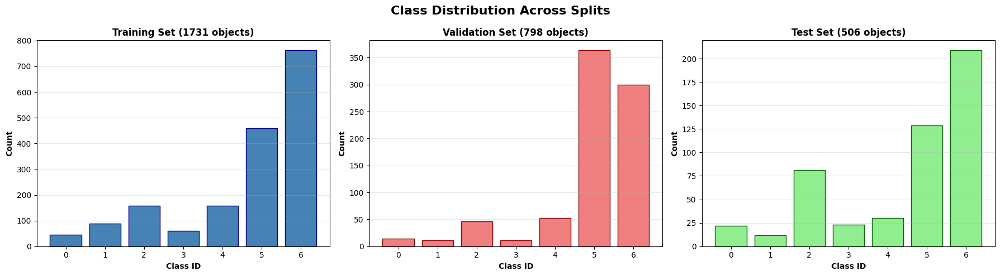

DATASET BALANCE ANALYSIS
Least common class: 82 objects
Most common class:  1272 objects
Balance ratio:      0.06

⚠ Significant imbalance - may affect training
  Consider:
  • Collecting more data for underrepresented classes
  • Using data augmentation
  • Adjusting class weights during training

✓ Label distribution analysis complete!


In [9]:
print("📊 Analyzing label distribution across dataset...")
print()

def analyze_labels(labels_folder, class_names):
    """
    Analyze label files in a folder
    Returns class counts and bbox statistics
    """
    class_counts = {i: 0 for i in range(len(class_names))}
    bbox_sizes = []
    total_objects = 0

    label_files = [f for f in os.listdir(labels_folder) if f.endswith('.txt')]

    for label_file in label_files:
        label_path = os.path.join(labels_folder, label_file)

        with open(label_path, 'r') as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                class_id = int(parts[0])
                width = float(parts[3])
                height = float(parts[4])

                if class_id in class_counts:
                    class_counts[class_id] += 1
                    total_objects += 1
                    bbox_sizes.append((width, height))

    return class_counts, bbox_sizes, total_objects

# Analyze each split
print("Analyzing training set...")
train_class_counts, train_bbox_sizes, train_total = analyze_labels(train_labels, class_list)

print("Analyzing validation set...")
valid_class_counts, valid_bbox_sizes, valid_total = analyze_labels(valid_labels, class_list)

print("Analyzing test set...")
test_class_counts, test_bbox_sizes, test_total = analyze_labels(test_labels, class_list)

print()
print("="*60)
print("CLASS DISTRIBUTION")
print("="*60)
print()

# Display class distribution
print(f"{'Class':<20s} {'Train':>8s} {'Valid':>8s} {'Test':>8s} {'Total':>8s}")
print("-"*60)

for i, class_name in enumerate(class_list):
    train_count = train_class_counts.get(i, 0)
    valid_count = valid_class_counts.get(i, 0)
    test_count = test_class_counts.get(i, 0)
    total_count = train_count + valid_count + test_count

    print(f"{class_name:<20s} {train_count:>8d} {valid_count:>8d} "
          f"{test_count:>8d} {total_count:>8d}")

print("-"*60)
print(f"{'TOTAL':<20s} {train_total:>8d} {valid_total:>8d} "
      f"{test_total:>8d} {train_total + valid_total + test_total:>8d}")
print()

# Visualize class distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Class Distribution Across Splits', fontsize=16, fontweight='bold')

# Training distribution
axes[0].bar(range(len(class_list)),
           [train_class_counts.get(i, 0) for i in range(len(class_list))],
           color='steelblue', edgecolor='navy')
axes[0].set_xlabel('Class ID', fontweight='bold')
axes[0].set_ylabel('Count', fontweight='bold')
axes[0].set_title(f'Training Set ({train_total} objects)', fontweight='bold')
axes[0].set_xticks(range(len(class_list)))
axes[0].set_xticklabels([f'{i}' for i in range(len(class_list))])
axes[0].grid(axis='y', alpha=0.3)

# Validation distribution
axes[1].bar(range(len(class_list)),
           [valid_class_counts.get(i, 0) for i in range(len(class_list))],
           color='lightcoral', edgecolor='darkred')
axes[1].set_xlabel('Class ID', fontweight='bold')
axes[1].set_ylabel('Count', fontweight='bold')
axes[1].set_title(f'Validation Set ({valid_total} objects)', fontweight='bold')
axes[1].set_xticks(range(len(class_list)))
axes[1].set_xticklabels([f'{i}' for i in range(len(class_list))])
axes[1].grid(axis='y', alpha=0.3)

# Test distribution
axes[2].bar(range(len(class_list)),
           [test_class_counts.get(i, 0) for i in range(len(class_list))],
           color='lightgreen', edgecolor='darkgreen')
axes[2].set_xlabel('Class ID', fontweight='bold')
axes[2].set_ylabel('Count', fontweight='bold')
axes[2].set_title(f'Test Set ({test_total} objects)', fontweight='bold')
axes[2].set_xticks(range(len(class_list)))
axes[2].set_xticklabels([f'{i}' for i in range(len(class_list))])
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Check balance
print("="*60)
print("DATASET BALANCE ANALYSIS")
print("="*60)

total_counts = [train_class_counts.get(i, 0) + valid_class_counts.get(i, 0) +
                test_class_counts.get(i, 0) for i in range(len(class_list))]

if len(total_counts) > 0 and max(total_counts) > 0:
    min_count = min(total_counts)
    max_count = max(total_counts)
    balance_ratio = min_count / max_count if max_count > 0 else 0

    print(f"Least common class: {min_count} objects")
    print(f"Most common class:  {max_count} objects")
    print(f"Balance ratio:      {balance_ratio:.2f}")
    print()

    if balance_ratio >= 0.7:
        print("✓ Dataset is well-balanced!")
    elif balance_ratio >= 0.4:
        print("⚠ Moderate imbalance - consider data augmentation")
    else:
        print("⚠ Significant imbalance - may affect training")
        print("  Consider:")
        print("  • Collecting more data for underrepresented classes")
        print("  • Using data augmentation")
        print("  • Adjusting class weights during training")

print("="*60)
print()
print("✓ Label distribution analysis complete!")

# choosing the models
# Explanation:

YOLOv8 comes in 5 sizes, each with different tradeoffs:

**YOLOv8n (nano): **    --->    Fastest, smallest (3.2M params)

**YOLOv8s (small):      -->    Fast, good accuracy (11.2M params)**


**YOLOv8m (medium):**  --->  Balanced (25.9M params) ← RECOMMENDED

**YOLOv8l (large):**  ----->   High accuracy (43.7M params)

**YOLOv8x (xlarge):**  ----->  Best accuracy (68.2M params)

TRANSFER LEARNING:
We use a pretrained model (trained on COCO dataset with
80 object classes) and fine-tune it for YOUR road objects!

Benefits:
- Much faster training (hours vs days)
- Better accuracy with less data
- Model already knows edges, shapes, textures
- We just teach it YOUR specific objects

In [10]:


# Choose model size
model_size = 'm'  # Options: 'n', 's', 'm', 'l', 'x'
model_name = f'yolov8{model_size}.pt'

print(f"Selected: YOLOv8{model_size.upper()}")
print()
print("📥 Loading pretrained model...")
print("   (First time downloads ~50MB, then cached locally)")
print()

# Load pretrained YOLOv8 model
model = YOLO(model_name)

print("✓ Model loaded successfully!")

print()
print("✓ Ready to start training!")

Selected: YOLOv8M

📥 Loading pretrained model...
   (First time downloads ~50MB, then cached locally)

✓ Model loaded successfully!

✓ Ready to start training!


YOLOv8 Neural Network has 3 main parts:

# 1. BACKBONE (Feature Extractor):
   → Convolutional layers extract features
   → Early layers: edges, colors
   → Middle layers: textures, patterns
   → Deep layers: object-specific features

# 2. NECK (Feature Fusion):
   → Combines features from different scales
   → Helps detect both small and large objects
   → Uses FPN (Feature Pyramid Network)

# 3. HEAD (Detector):
   → Predicts bounding boxes
   → Classifies objects
   → Outputs: [x, y, w, h, confidence, class]

# How it learns:
  Input Image → CNN Layers → Feature Maps → Predictions
  Compare with truth → Calculate loss → Update weights
  Repeat thousands of times!

🔹 epochs (100):
   - Complete passes through dataset
   - More = more learning but risk overfitting
   - Model stops early if no improvement (patience=50)

🔹 batch (16):
   - Images processed together
   - Larger = faster but needs more GPU memory
   - Reduce to 8 or 4 if out-of-memory error

🔹 imgsz (640):
   - Images resized to 640x640 pixels
   - Larger = more detail but slower
   - 640 is sweet spot for most cases

🔹 lr0 (0.01):
   - Learning rate - step size during learning
   - Too high = unstable, too low = slow
   - YOLOv8 uses cosine annealing (automatic decay)

🔹 patience (50):
   - Epochs to wait without improvement
   - Prevents wasting time on plateau
   - Early stopping saves hours!

🔹 optimizer (auto):
   - SGD: Classic, proven, works well
   - Adam: Adaptive, sometimes faster
   - AdamW: Adam + weight decay
   - 'auto' lets YOLOv8 choose best

In [11]:
hyperparameters = {
    'epochs': 100,              # Training epochs (adjust based on dataset size)
    'batch': 16,                # Batch size (reduce if GPU memory error)
    'imgsz': 640,               # Image size
    'patience': 50,             # Early stopping patience
    'device': 0 if torch.cuda.is_available() else 'cpu',
    'workers': 8,               # Data loading workers
    'project': 'yolov8_road',   # Project folder name
    'name': 'exp',              # Experiment name
    'exist_ok': True,           # Overwrite existing
    'pretrained': True,         # Use pretrained weights
    'optimizer': 'auto',        # Optimizer (auto, SGD, Adam, AdamW)
    'lr0': 0.01,                # Initial learning rate
    'lrf': 0.01,                # Final learning rate fraction
    'momentum': 0.937,          # Momentum
    'weight_decay': 0.0005,     # Weight decay
    'warmup_epochs': 3.0,       # Warmup epochs
    'warmup_momentum': 0.8,     # Warmup momentum
    'box': 7.5,                 # Box loss gain
    'cls': 0.5,                 # Classification loss gain
    'dfl': 1.5,                 # DFL loss gain
    'pose': 12.0,               # Pose loss gain
    'kobj': 2.0,                # Keypoint obj loss gain
    'save': True,               # Save checkpoints
    'save_period': -1,          # Save every N epochs (-1 = only best)
    'cache': False,             # Cache images (True for faster but uses RAM)
    'plots': True,              # Save plots
    'verbose': True,            # Verbose output
}



# trainning the model

In [12]:


results = model.train(
    data=data_yaml_path,
    epochs=hyperparameters['epochs'],
    batch=hyperparameters['batch'],
    imgsz=hyperparameters['imgsz'],
    patience=hyperparameters['patience'],
    device=hyperparameters['device'],
    workers=hyperparameters['workers'],
    project=hyperparameters['project'],
    name=hyperparameters['name'],
    exist_ok=hyperparameters['exist_ok'],
    pretrained=hyperparameters['pretrained'],
    optimizer=hyperparameters['optimizer'],
    lr0=hyperparameters['lr0'],
    lrf=hyperparameters['lrf'],
    momentum=hyperparameters['momentum'],
    weight_decay=hyperparameters['weight_decay'],
    warmup_epochs=hyperparameters['warmup_epochs'],
    box=hyperparameters['box'],
    cls=hyperparameters['cls'],
    save=hyperparameters['save'],
    plots=hyperparameters['plots'],
    verbose=hyperparameters['verbose']
)


Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=50, perspective=0.0, plots=True, pose=12.0, pretrained=T

# visualization the results

    📖 HOW TO READ:
    • Box Loss: Bounding box accuracy (↓ better)
    • Class Loss: Classification accuracy (↓ better)  
    • Precision: Correct detections / all detections (↑ better)
    • Recall: Found objects / all objects (↑ better)
    • mAP50: Overall accuracy @ 50% IoU (↑ better)
    • mAP50-95: Strict accuracy 50-95% IoU (↑ better)
    
    Good training shows:
    ✓ Losses decreasing steadily
    ✓ mAP increasing then plateauing
    ✓ No huge gap between train/val curves

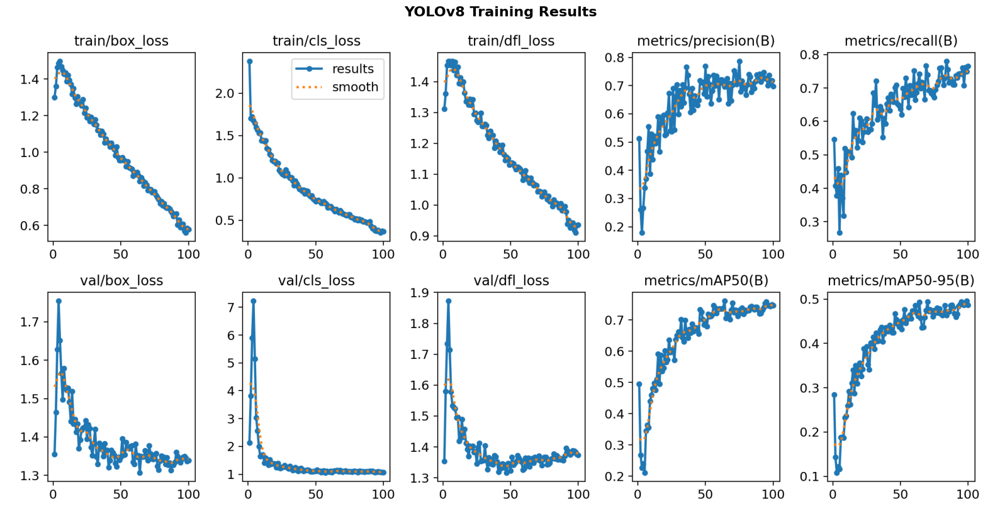

In [13]:
results_dir = os.path.join(hyperparameters['project'], hyperparameters['name'])
results_img = os.path.join(results_dir, 'results.png')

if os.path.exists(results_img):
    img = Image.open(results_img)
    plt.figure(figsize=(16, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title('YOLOv8 Training Results', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# hypermaters and evalute on the valid set

In [14]:

best_model_path = os.path.join(hyperparameters['project'],
                               hyperparameters['name'],
                               'weights', 'best.pt')

if os.path.exists(best_model_path):
    best_model = YOLO(best_model_path)
    print(f"✓ Best model loaded: {best_model_path}")
    print(f"✓ Fine-tuned for {len(class_list)} classes")
else:
    print(f"⚠ Model not found at {best_model_path}")
    print("  Make sure training completed successfully")

✓ Best model loaded: yolov8_road/exp/weights/best.pt
✓ Fine-tuned for 7 classes


In [15]:
val_results = best_model.val(
    data=data_yaml_path,
    split='val',
    imgsz=hyperparameters['imgsz'],
    batch=hyperparameters['batch'],
    device=hyperparameters['device']
)

print("\n📊 Validation Metrics:")
print(f"  Precision: {val_results.results_dict.get('metrics/precision(B)', 0):.4f}")
print(f"  Recall:    {val_results.results_dict.get('metrics/recall(B)', 0):.4f}")
print(f"  mAP50:     {val_results.results_dict.get('metrics/mAP50(B)', 0):.4f}")
print(f"  mAP50-95:  {val_results.results_dict.get('metrics/mAP50-95(B)', 0):.4f}")

Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,843,813 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1243.9±265.8 MB/s, size: 35.1 KB)
val: Scanning /content/dataset/valid/labels.cache... 187 images, 14 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 187/187 317.3Kit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 789, len(boxes) = 798. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.1it/s 5.8s
                   all        187        798      0.716      0.749      0.749      0.497
              bicycles          7         14      0.602        0.5       0.53      0.379
                 buses         10       

# final evaluation

In [16]:
test_results = best_model.val(
    data=data_yaml_path,
    split='test',
    imgsz=hyperparameters['imgsz'],
    batch=hyperparameters['batch'],
    device=hyperparameters['device']
)

test_precision = test_results.results_dict.get('metrics/precision(B)', 0)
test_recall = test_results.results_dict.get('metrics/recall(B)', 0)
test_mAP50 = test_results.results_dict.get('metrics/mAP50(B)', 0)
test_mAP50_95 = test_results.results_dict.get('metrics/mAP50-95(B)', 0)

print("\n🏆 FINAL TEST RESULTS:")
print(f"  Precision: {test_precision:.4f} ({test_precision*100:.2f}%)")
print(f"  Recall:    {test_recall:.4f} ({test_recall*100:.2f}%)")
print(f"  mAP50:     {test_mAP50:.4f} ({test_mAP50*100:.2f}%)")
print(f"  mAP50-95:  {test_mAP50_95:.4f} ({test_mAP50_95*100:.2f}%)")


Ultralytics 8.3.237 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 5.8±2.9 MB/s, size: 43.9 KB)
val: Scanning /content/dataset/test/labels... 133 images, 7 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 133/133 664.3it/s 0.2s
val: New cache created: /content/dataset/test/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 103, len(boxes) = 506. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 1.9it/s 4.7s
                   all        133        506      0.759       0.65      0.695      0.402
              bicycles         18         22      0.797      0.591      0.715      0.313
                 buses         11         12      0.549      0.711      0.646  

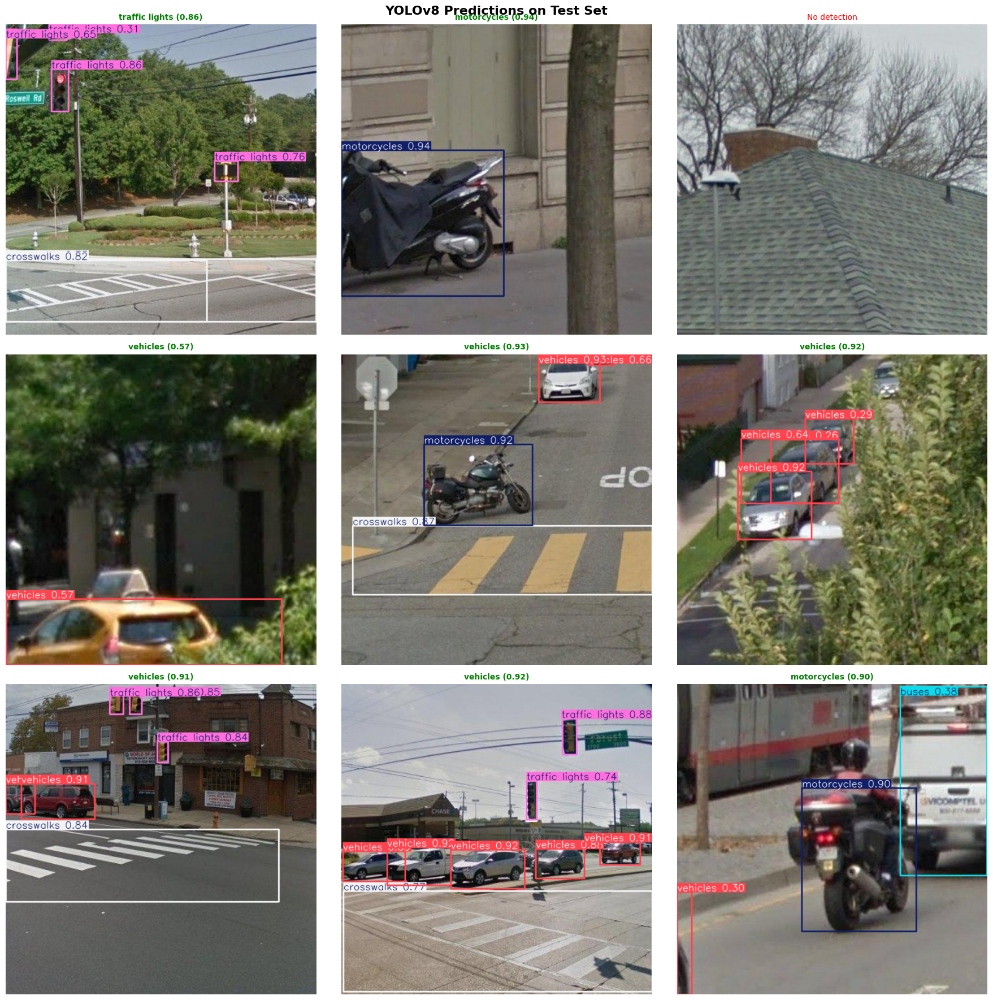

✓ Predictions visualized!


In [17]:

test_img_files = [f for f in os.listdir(test_images)
                  if f.endswith(('.jpg', '.png', '.jpeg'))]
sample_tests = random.sample(test_img_files, min(9, len(test_img_files)))

fig, axes = plt.subplots(3, 3, figsize=(18, 18))
fig.suptitle('YOLOv8 Predictions on Test Set', fontsize=16, fontweight='bold')

for idx, img_file in enumerate(sample_tests):
    row, col = idx // 3, idx % 3
    img_path = os.path.join(test_images, img_file)

    results = best_model.predict(source=img_path, conf=0.25, verbose=False)
    result = results[0]

    annotated = result.plot()
    annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

    axes[row, col].imshow(annotated_rgb)
    axes[row, col].axis('off')

    if len(result.boxes) > 0:
        pred_cls = int(result.boxes.cls[0])
        conf = float(result.boxes.conf[0])
        axes[row, col].set_title(
            f'{class_list[pred_cls]} ({conf:.2f})',
            fontsize=10, fontweight='bold', color='green'
        )
    else:
        axes[row, col].set_title('No detection', fontsize=10, color='red')

plt.tight_layout()
plt.show()
print("✓ Predictions visualized!")


📊 Displaying confusion matrix...


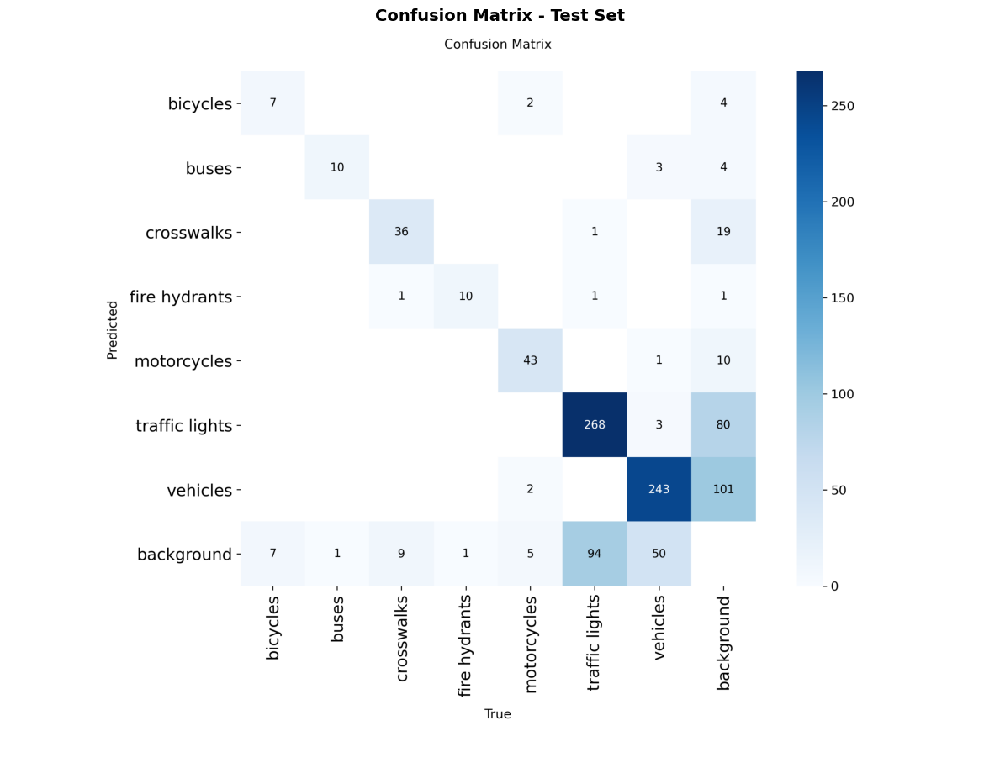

In [18]:
cm_path = os.path.join(results_dir, 'confusion_matrix.png')
if os.path.exists(cm_path):
    print("\n📊 Displaying confusion matrix...")
    cm_img = Image.open(cm_path)
    plt.figure(figsize=(12, 10))
    plt.imshow(cm_img)
    plt.axis('off')
    plt.title('Confusion Matrix - Test Set', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [19]:
print(f"""
📊 DATASET:
  • Training:   {train_img_count} images
  • Validation: {valid_img_count} images
  • Test:       {test_img_count} images
  • Classes:    {len(class_list)} ({', '.join(class_list)})

🤖 MODEL:
  • Architecture: YOLOv8{model_size.upper()}
  • Method: Transfer Learning (Fine-tuned)
  • Input Size: {hyperparameters['imgsz']}x{hyperparameters['imgsz']}

📈 PERFORMANCE:
  • Test Precision: {test_precision:.4f}
  • Test Recall:    {test_recall:.4f}
  • Test mAP50:     {test_mAP50:.4f} ({test_mAP50*100:.2f}%)
  • Test mAP50-95:  {test_mAP50_95:.4f}

💾 SAVED FILES:
  • Best Model:    {best_model_path}
  • Results:       {results_dir}

✅ ACHIEVEMENTS:
  ✓ Loaded and verified YOLO-format dataset
  ✓ Trained state-of-the-art object detector
  ✓ Achieved {test_mAP50*100:.1f}% mAP50 accuracy
  ✓ Evaluated on test set
  ✓ Exported for deployment
  ✓ Created complete inference pipeline

🚀 NEXT STEPS:
  1. Deploy model to production
  2. Build REST API for predictions
  3. Create web interface
  4. Implement CNN from scratch
  5. Try R-CNN for comparison

🎓 KEY LEARNINGS:
  • Deep learning > Traditional ML for vision
  • Transfer learning is powerful
  • Neural networks learn features automatically
  • mAP is standard metric for detection
  • YOLOv8 achieves real-time performance

Congratulations! You've built a production-ready object detector! 🏆
""")
print("="*70)


📊 DATASET:
  • Training:   494 images
  • Validation: 187 images
  • Test:       133 images
  • Classes:    7 (bicycles, buses, crosswalks, fire hydrants, motorcycles, traffic lights, vehicles)

🤖 MODEL:
  • Architecture: YOLOv8M
  • Method: Transfer Learning (Fine-tuned)
  • Input Size: 640x640

📈 PERFORMANCE:
  • Test Precision: 0.7587
  • Test Recall:    0.6501
  • Test mAP50:     0.6945 (69.45%)
  • Test mAP50-95:  0.4015

💾 SAVED FILES:
  • Best Model:    yolov8_road/exp/weights/best.pt
  • Results:       yolov8_road/exp

✅ ACHIEVEMENTS:
  ✓ Loaded and verified YOLO-format dataset
  ✓ Trained state-of-the-art object detector
  ✓ Achieved 69.5% mAP50 accuracy
  ✓ Evaluated on test set
  ✓ Exported for deployment
  ✓ Created complete inference pipeline

🚀 NEXT STEPS:
  1. Deploy model to production
  2. Build REST API for predictions
  3. Create web interface
  4. Implement CNN from scratch
  5. Try R-CNN for comparison

🎓 KEY LEARNINGS:
  • Deep learning > Traditional ML for visio

🔎 Scoring 133 test images...


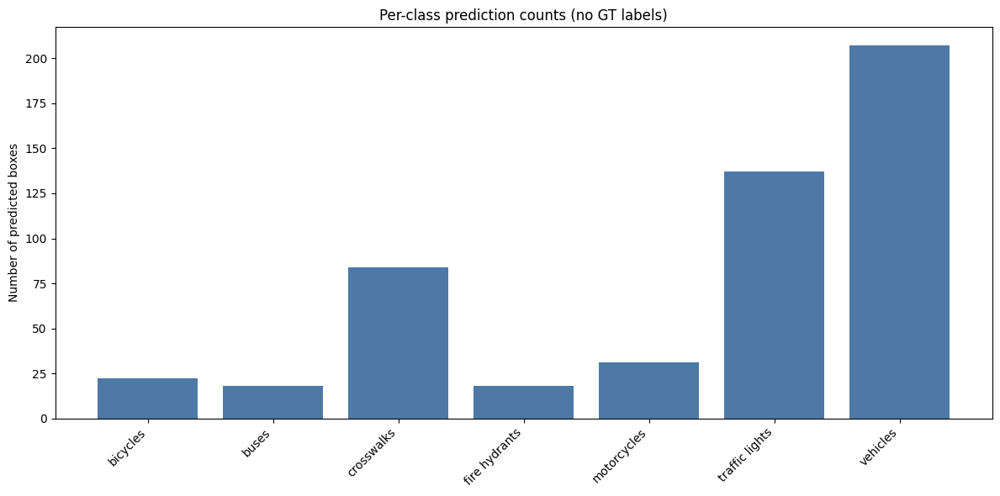

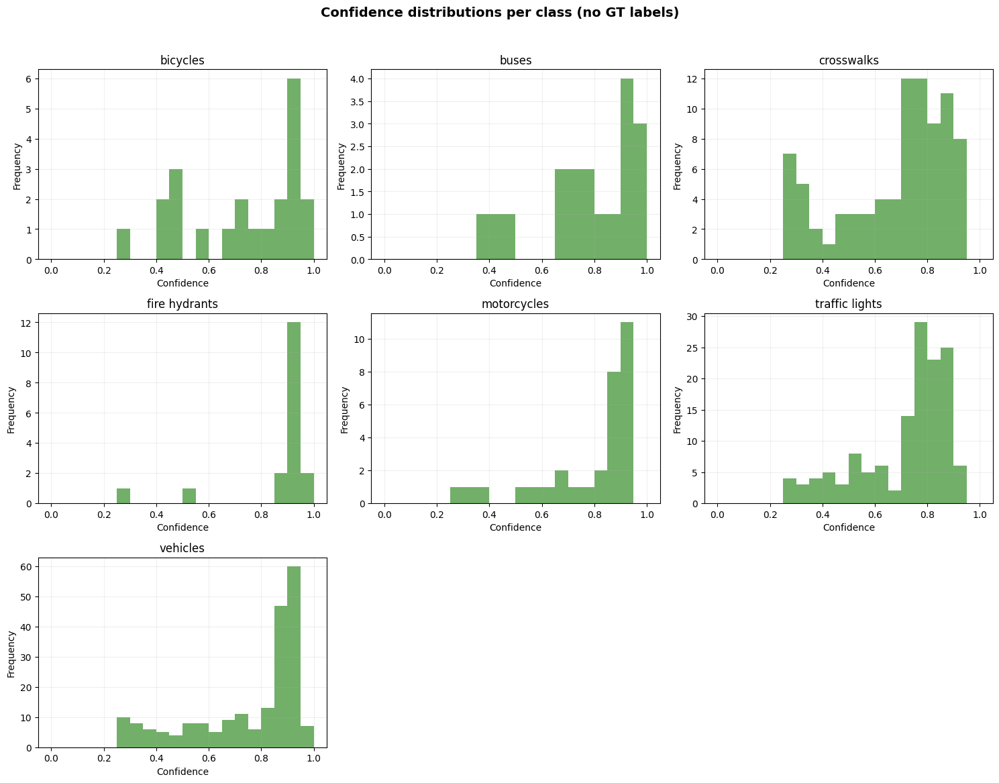

In [20]:

import os, cv2, random
import numpy as np
import matplotlib.pyplot as plt

# Assumes: best_model, test_images, class_list already defined
# Convert class names from dict to list if needed
if isinstance(class_list, dict):
    class_names = [class_list[i] for i in range(len(class_list))]
else:
    class_names = list(class_list)
num_classes = len(class_names)

# Collect per-class counts and confidence distributions
pred_counts = np.zeros(num_classes, dtype=int)
conf_by_class = [[] for _ in range(num_classes)]

test_img_files = [f for f in os.listdir(test_images) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

print(f"🔎 Scoring {len(test_img_files)} test images...")
for img_file in test_img_files:
    img_path = os.path.join(test_images, img_file)
    res = best_model.predict(source=img_path, conf=0.25, verbose=False)[0]
    boxes = res.boxes

    if len(boxes) > 0:
        cls = boxes.cls.cpu().numpy().astype(int)
        conf = boxes.conf.cpu().numpy()
        for c, s in zip(cls, conf):
            pred_counts[c] += 1
            conf_by_class[c].append(float(s))

# --- Plot per-class prediction counts ---
plt.figure(figsize=(12, 6))
plt.bar(range(num_classes), pred_counts, color='#4e79a7')
plt.xticks(range(num_classes), class_names, rotation=45, ha='right')
plt.ylabel('Number of predicted boxes')
plt.title('Per-class prediction counts (no GT labels)')
plt.tight_layout()
plt.show()

# --- Plot per-class confidence histograms ---
cols = 3
rows = int(np.ceil(num_classes / cols))
plt.figure(figsize=(5*cols, 3.8*rows))
for i in range(num_classes):
    plt.subplot(rows, cols, i+1)
    confs = conf_by_class[i]
    if len(confs) == 0:
        plt.text(0.5, 0.5, 'No predictions', ha='center', va='center', fontsize=10)
        plt.title(class_names[i])
        plt.axis('off')
        continue
    plt.hist(confs, bins=20, range=(0,1), color='#59a14f', alpha=0.85)
    plt.title(class_names[i])
    plt.xlabel('Confidence')
    plt.ylabel('Frequency')
    plt.grid(alpha=0.2)
plt.suptitle('Confidence distributions per class (no GT labels)', y=1.02, fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


🔎 Evaluating 133 images with labels...


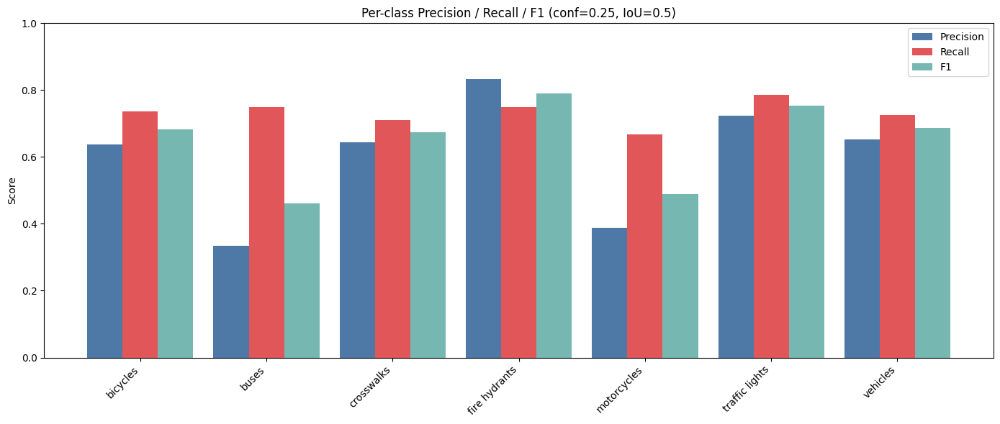

In [21]:

import os, cv2, numpy as np, matplotlib.pyplot as plt

# --- Required inputs ---
# test_images: directory of test images
# test_labels: directory of YOLO-format labels (.txt)
# best_model: loaded YOLO model
# class_list: list or dict of class names
# Configure thresholds
CONF_THRES = 0.25
IOU_THRES = 0.50

# Normalize class names
if isinstance(class_list, dict):
    class_names = [class_list[i] for i in range(len(class_list))]
else:
    class_names = list(class_list)
num_classes = len(class_names)

# Helper: load YOLO labels and convert to xyxy pixel coords
def load_yolo_labels(label_file, img_w, img_h):
    gts = []
    if not os.path.exists(label_file):
        return gts
    with open(label_file, 'r') as f:
        for ln in f:
            parts = ln.strip().split()
            if len(parts) != 5:
                continue
            cls = int(round(float(parts[0])))
            xc = float(parts[1]) * img_w
            yc = float(parts[2]) * img_h
            w  = float(parts[3]) * img_w
            h  = float(parts[4]) * img_h
            x1 = xc - w/2
            y1 = yc - h/2
            x2 = xc + w/2
            y2 = yc + h/2
            gts.append({'cls': cls, 'bbox': np.array([x1, y1, x2, y2], dtype=np.float32)})
    return gts

def iou_xyxy(box1, box2):
    xA = max(box1[0], box2[0]); yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2]); yB = min(box1[3], box2[3])
    inter = max(0.0, xB - xA) * max(0.0, yB - yA)
    area1 = max(0.0, box1[2] - box1[0]) * max(0.0, box1[3] - box1[1])
    area2 = max(0.0, box2[2] - box2[0]) * max(0.0, box2[3] - box2[1])
    union = area1 + area2 - inter
    return inter / union if union > 0 else 0.0

# Accumulators
TP = np.zeros(num_classes, dtype=int)
FP = np.zeros(num_classes, dtype=int)
FN = np.zeros(num_classes, dtype=int)
conf_by_class = [[] for _ in range(num_classes)]

test_img_files = [f for f in os.listdir(test_images) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
print(f"🔎 Evaluating {len(test_img_files)} images with labels...")

for img_file in test_img_files:
    img_path = os.path.join(test_images, img_file)
    label_path = os.path.join(test_labels, os.path.splitext(img_file)[0] + '.txt')

    # Load image and GTs
    img = cv2.imread(img_path)
    if img is None:
        continue
    h, w = img.shape[:2]
    gts = load_yolo_labels(label_path, w, h)

    # Predict
    res = best_model.predict(source=img_path, conf=CONF_THRES, verbose=False)[0]
    boxes = res.boxes
    if len(boxes) == 0:
        # All GTs become FN
        for gt in gts:
            FN[gt['cls']] += 1
        continue

    p_xyxy = boxes.xyxy.cpu().numpy()
    p_cls  = boxes.cls.cpu().numpy().astype(int)
    p_conf = boxes.conf.cpu().numpy()

    # Greedy matching: sort predictions by confidence
    order = np.argsort(-p_conf)
    p_xyxy = p_xyxy[order]
    p_cls  = p_cls[order]
    p_conf = p_conf[order]

    used_gt = [False] * len(gts)
    for bbox, c, s in zip(p_xyxy, p_cls, p_conf):
        conf_by_class[c].append(float(s))
        # find best available GT of same class
        best_iou, best_idx = 0.0, -1
        for i, gt in enumerate(gts):
            if used_gt[i] or gt['cls'] != c:
                continue
            iou = iou_xyxy(bbox, gt['bbox'])
            if iou > best_iou:
                best_iou, best_idx = iou, i
        if best_iou >= IOU_THRES and best_idx >= 0:
            TP[c] += 1
            used_gt[best_idx] = True
        else:
            FP[c] += 1

    # remaining unmatched GTs are FN
    for i, gt in enumerate(gts):
        if not used_gt[i]:
            FN[gt['cls']] += 1

# Metrics
precision = np.divide(TP, TP + FP, out=np.zeros_like(TP, dtype=float), where=(TP + FP) > 0)
recall    = np.divide(TP, TP + FN, out=np.zeros_like(TP, dtype=float), where=(TP + FN) > 0)
f1        = np.divide(2 * precision * recall, precision + recall,
                      out=np.zeros_like(precision), where=(precision + recall) > 0)

# Display per-class bars
x = np.arange(num_classes)
width = 0.28
plt.figure(figsize=(14, 6))
plt.bar(x - width, precision, width, label='Precision', color='#4e79a7')
plt.bar(x,         recall,    width, label='Recall',    color='#e15759')
plt.bar(x + width, f1,        width, label='F1',        color='#76b7b2')
plt.xticks(x, class_names, rotation=45, ha='right')
plt.ylim(0, 1.0)
plt.ylabel('Score')
plt.title(f'Per-class Precision / Recall / F1 (conf={CONF_THRES}, IoU={IOU_THRES})')
plt.legend()
plt.tight_layout()
plt.show()



🔎 Evaluating 133 images...


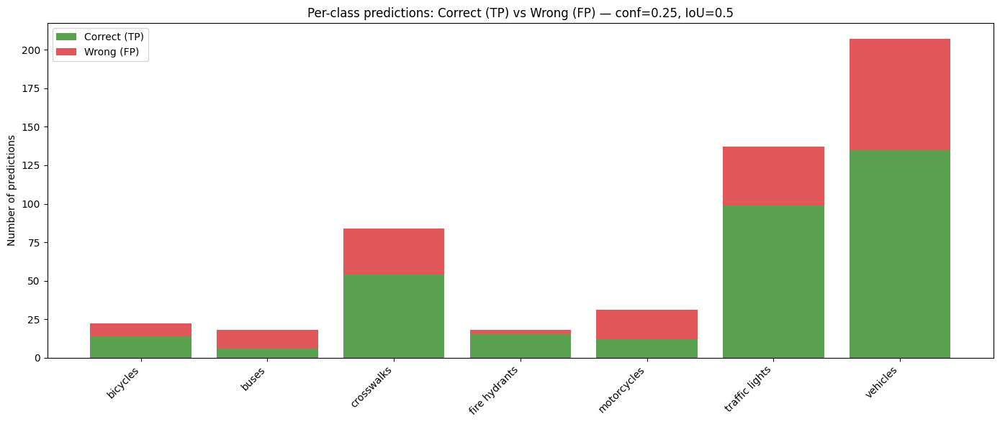

In [23]:

import os, cv2, numpy as np
import matplotlib.pyplot as plt

# --- Inputs you already have ---
# best_model       # your YOLOv8 model
# test_images      # path to test images folder
# test_labels      # path to YOLO txt labels for test images
# class_list       # e.g. list like ['cat','dog',...] or dict {0:'cat',1:'dog',...}

CONF_THRES = 0.25   # prediction confidence threshold
IOU_THRES  = 0.50   # IoU threshold to consider a match correct (TP)

# Normalize class names
if isinstance(class_list, dict):
    class_names = [class_list[i] for i in range(len(class_list))]
else:
    class_names = list(class_list)
num_classes = len(class_names)

# --- Helpers ---
def load_yolo_labels(label_file, img_w, img_h):
    """Load YOLO-format labels and convert to xyxy pixel boxes."""
    gts = []
    if not os.path.exists(label_file):
        return gts
    with open(label_file, 'r') as f:
        for ln in f:
            parts = ln.strip().split()
            if len(parts) != 5:
                continue
            cls = int(round(float(parts[0])))
            xc = float(parts[1]) * img_w
            yc = float(parts[2]) * img_h
            w  = float(parts[3]) * img_w
            h  = float(parts[4]) * img_h
            x1 = xc - w/2
            y1 = yc - h/2
            x2 = xc + w/2
            y2 = yc + h/2
            gts.append({'cls': cls, 'bbox': np.array([x1, y1, x2, y2], dtype=np.float32)})
    return gts

def iou_xyxy(box1, box2):
    """IoU for xyxy boxes."""
    xA = max(box1[0], box2[0]); yA = max(box1[1], box2[1])
    xB = min(box1[2], box2[2]); yB = min(box1[3], box2[3])
    inter = max(0.0, xB - xA) * max(0.0, yB - yA)
    area1 = max(0.0, box1[2] - box1[0]) * max(0.0, box1[3] - box1[1])
    area2 = max(0.0, box2[2] - box2[0]) * max(0.0, box2[3] - box2[1])
    union = area1 + area2 - inter
    return inter / union if union > 0 else 0.0

# --- Accumulators ---
TP = np.zeros(num_classes, dtype=int)   # correct detections
FP = np.zeros(num_classes, dtype=int)   # wrong detections (no matching GT of same class & IoU)
FN = np.zeros(num_classes, dtype=int)   # missed GTs
conf_by_class = [[] for _ in range(num_classes)]  # confidences of predictions per class

# --- Evaluate all test images ---
test_img_files = [f for f in os.listdir(test_images) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
print(f"🔎 Evaluating {len(test_img_files)} images...")

for img_file in test_img_files:
    img_path   = os.path.join(test_images, img_file)
    label_path = os.path.join(test_labels, os.path.splitext(img_file)[0] + '.txt')

    img = cv2.imread(img_path)
    if img is None:
        continue
    h, w = img.shape[:2]
    gts = load_yolo_labels(label_path, w, h)

    res = best_model.predict(source=img_path, conf=CONF_THRES, verbose=False)[0]
    boxes = res.boxes
    if len(boxes) == 0:
        # No predictions: all GTs are missed
        for gt in gts:
            FN[gt['cls']] += 1
        continue

    p_xyxy = boxes.xyxy.cpu().numpy()
    p_cls  = boxes.cls.cpu().numpy().astype(int)
    p_conf = boxes.conf.cpu().numpy()

    # Sort predictions by confidence (greedy matching prefers higher conf boxes)
    order = np.argsort(-p_conf)
    p_xyxy = p_xyxy[order]
    p_cls  = p_cls[order]
    p_conf = p_conf[order]

    used_gt = [False] * len(gts)

    for bbox, c, s in zip(p_xyxy, p_cls, p_conf):
        conf_by_class[c].append(float(s))
        # find best matching GT of same class
        best_iou, best_idx = 0.0, -1
        for i, gt in enumerate(gts):
            if used_gt[i] or gt['cls'] != c:
                continue
            iou = iou_xyxy(bbox, gt['bbox'])
            if iou > best_iou:
                best_iou, best_idx = iou, i

        if best_iou >= IOU_THRES and best_idx >= 0:
            TP[c] += 1
            used_gt[best_idx] = True
        else:
            FP[c] += 1

    # Unmatched GTs are FN
    for i, gt in enumerate(gts):
        if not used_gt[i]:
            FN[gt['cls']] += 1

# --- Metrics ---
precision = np.divide(TP, TP + FP, out=np.zeros_like(TP, dtype=float), where=(TP + FP) > 0)
recall    = np.divide(TP, TP + FN, out=np.zeros_like(TP, dtype=float), where=(TP + FN) > 0)
f1        = np.divide(2 * precision * recall, precision + recall,
                      out=np.zeros_like(precision), where=(precision + recall) > 0)

# --- Visualization 1: Stacked bar of correct (TP) vs wrong (FP) per class ---
x = np.arange(num_classes)
plt.figure(figsize=(14, 6))
plt.bar(x, TP, label='Correct (TP)', color='#59a14f')
plt.bar(x, FP, bottom=TP, label='Wrong (FP)', color='#e15759')
plt.xticks(x, class_names, rotation=45, ha='right')
plt.ylabel('Number of predictions')
plt.title(f'Per-class predictions: Correct (TP) vs Wrong (FP) — conf={CONF_THRES}, IoU={IOU_THRES}')
plt.legend()
plt.tight_layout()
plt.show()




